In [1]:
from geomstats.geometry.special_orthogonal import SpecialOrthogonal
from geomstats.learning.pca import TangentPCA

so3 = SpecialOrthogonal(n=3, point_type="vector")
metric = so3.bi_invariant_metric

data = so3.random_uniform(n_samples=10)

tpca = TangentPCA(metric=metric, n_components=2)
tpca = tpca.fit(data)
tangent_projected_data = tpca.transform(data)

INFO: Using numpy backend


In [2]:
import geomstats.datasets.utils as data_utils

cells1, lines, treatments = data_utils.load_cells()
print(f"Total number of cells : {len(cells1)}")

INFO: NumExpr defaulting to 8 threads.


Total number of cells : 650


In [3]:
import warnings

warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt

import geomstats.backend as gs

gs.random.seed(2021)

In [4]:
import pandas as pd
data = pd.read_csv("ogdseveritylabeled.csv")
dataAr = data['treatment_group'].tolist()

In [5]:
import pandas as pd
import pickle
datas = pd.read_pickle('raw-properties__.pickle')

In [6]:
datas

,filename,image_id,label,centroid-y,centroid-x,area,bbox_area,convex_area,filled_area,perimeter,...,major_axis_length,minor_axis_length,orientation,euler_number,eccentricity,solidity,extent,raw_contour,circularity,aspect_ratio
0,4-59_3_40x_thalamus_5_yen_thresh.tif,0,1,20.604520,384.011299,177,399,348,177,118.669048,...,26.119535,21.108539,1.113104,1,0.588975,0.508621,0.443609,"[[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 16, ...",0.157946,1.237392
1,4-59_3_40x_thalamus_5_yen_thresh.tif,0,2,47.279570,218.630824,279,374,304,279,66.941125,...,20.944416,17.171929,1.559710,1,0.572534,0.917763,0.745989,"[[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18,...",0.782399,1.219689
2,4-59_3_40x_thalamus_5_yen_thresh.tif,0,3,96.621711,213.996711,304,441,329,304,67.491378,...,20.213588,19.376192,-1.160550,1,0.284848,0.924012,0.689342,"[[10, 11, 12, 13, 14, 15, 15, 16, 17, 17, 17, ...",0.838662,1.043218
3,4-59_3_40x_thalamus_5_yen_thresh.tif,0,4,170.970339,382.063559,236,342,263,236,59.976659,...,18.190268,16.830708,1.155115,1,0.379336,0.897338,0.690058,"[[11, 12, 13, 14, 15, 16, 17, 17, 18, 18, 17, ...",0.824437,1.080779
4,4-59_3_40x_thalamus_5_yen_thresh.tif,0,5,183.589235,322.218130,353,483,365,353,68.183766,...,22.011260,20.525073,-0.433177,1,0.361220,0.967123,0.730849,"[[13, 14, 15, 16, 17, 18, 19, 19, 19, 20, 20, ...",0.954163,1.072408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37551,4-56-2_40x_thalamus_1_otsu_thresh.tif,679,58,457.909091,167.449761,209,306,239,209,59.041631,...,19.748891,14.222769,-0.552463,1,0.693787,0.874477,0.683007,"[[8, 9, 10, 11, 12, 13, 14, 15, 16, 16, 15, 14...",0.753424,1.388540
37552,4-56-2_40x_thalamus_1_otsu_thresh.tif,679,59,466.762295,337.606557,244,342,265,244,61.769553,...,18.334992,17.185241,-1.203300,1,0.348545,0.920755,0.713450,"[[7, 8, 9, 10, 11, 12, 13, 13, 14, 15, 16, 17,...",0.803620,1.066903
37553,4-56-2_40x_thalamus_1_otsu_thresh.tif,679,60,503.466899,323.243902,287,528,367,287,78.976659,...,24.865288,15.828205,-1.179497,1,0.771229,0.782016,0.543561,"[[18, 18, 18, 19, 19, 19, 20, 21, 22, 21, 22, ...",0.578222,1.570948
37554,4-56-2_40x_thalamus_1_otsu_thresh.tif,679,61,498.202247,7.786517,89,195,126,89,44.006097,...,17.256141,7.874673,0.989498,1,0.889805,0.706349,0.456410,"[[6, 7, 8, 9, 10, 11, 12, 12, 13, 13, 14, 14, ...",0.577530,2.191347


In [15]:
Control = []
OGD1 = []
OGD3 = []

In [ ]:
The control sets are codes: 4-50-4, 4-50-7, 4-50-10, and 4-50-15
The OGD 1.5 hour sets are: 4-56-6, 4-56-7, 4-56-8, 4-56-9, and 4-56-10
The OGD 3 hour sets are: 4-50-1, 4-50-5, 4-50-6, 4-50-12, and 4-50-14

In [32]:
datas['raw_contour'][2]

array([[10, 11, 12, 13, 14, 15, 15, 16, 17, 17, 17, 18, 19, 19, 19, 19,
        20, 20, 19, 19, 18, 18, 17, 16, 15, 14, 13, 12, 11, 10,  9,  8,
         7,  6,  5,  4,  3,  2,  1,  1,  0,  0,  0,  0,  0,  1,  2,  2,
         2,  3,  3,  4,  5,  6,  7,  8,  9,  9,  9],
       [ 1,  1,  1,  1,  1,  2,  3,  4,  4,  5,  6,  7,  7,  8,  9, 10,
        11, 12, 13, 14, 15, 16, 17, 18, 18, 19, 20, 20, 20, 20, 20, 19,
        19, 18, 18, 17, 17, 16, 16, 15, 14, 13, 12, 11, 10,  9,  8,  7,
         6,  5,  4,  4,  3,  3,  3,  3,  2,  1,  0]])

In [24]:
for x in range(37556):
    if((datas['filename'][x].contains(pat = '4-50-4'))or (datas['filename'][x]..contains(pat = '4-50-7')) or (datas['filename'][x].contains(pat = '4-50-10')) or (datas['filename'][x].contains(pat = '4-50-15')):
        print("x")

SyntaxError: invalid syntax (Temp/ipykernel_7948/3023664229.py, line 2)

In [43]:
import re
for x in range(37556):
    if(re.search('4-50-4|4-50-7|4-50-10|4-50-15', datas['filename'][x])):
        Control.append(datas['raw_contour'][x])
    elif(re.search('4-56-6|4-56-7|4-56-8|4-56-9|4-56-10', datas['filename'][x])):
        OGD1.append(datas['raw_contour'][x])
    elif(re.search('4-50-1|4-50-5|4-50-6|4-50-12|4-50-14', datas['filename'][x])):
        OGD3.append(datas['raw_contour'][x])

In [45]:
OGD3

[array([[17, 18, 19, 20, 21, 22, 23, 22, 21, 22, 23, 24, 25, 25, 25, 24,
         23, 22, 21, 21, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11,
         10,  9,  8,  7,  6,  5,  4,  3,  3,  2,  1,  0,  1,  0,  0,  0,
          0,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14,
         15, 16],
        [ 0,  0,  0,  0,  0,  0,  1,  2,  3,  4,  4,  5,  5,  6,  7,  7,
          7,  8,  9, 10, 11, 11, 12, 12, 12, 12, 12, 11, 10, 10, 10,  9,
          9,  9,  9,  9,  9, 10,  9, 10, 11, 10, 11, 11, 10,  9,  8,  7,
          6,  5,  5,  5,  4,  3,  3,  3,  3,  2,  2,  2,  2,  2,  1,  1,
          1,  0]]),
 array([[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27,
         28, 28, 28, 28, 27, 28, 27, 27, 27, 26, 26, 26, 25, 24, 23, 22,
         21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10,  9,  8,  7,  6,
          5,  4,  3,  2,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,
          2,  2,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 11],
        [ 0,  0,  0,  0,

In [48]:
import numpy as np
MainListOGD3 = []
for i in range(len(OGD3)):
    cellsDataFrame2 = OGD3[i]
    xData = cellsDataFrame2[0]
    yData = cellsDataFrame2[1]
    templistMain =[]
    for k in range(len(xData)):
        templist = [xData[k],yData[k]]
        templistMain.append(templist)
    j = np.asarray(templistMain, dtype='float32')    
    MainListOGD3.append(j)
    

In [50]:
import numpy as np
MainListOGD1 = []
for i in range(len(OGD1)):
    cellsDataFrame2 = OGD1[i]
    xData = cellsDataFrame2[0]
    yData = cellsDataFrame2[1]
    templistMain =[]
    for k in range(len(xData)):
        templist = [xData[k],yData[k]]
        templistMain.append(templist)
    j = np.asarray(templistMain, dtype='float32')    
    MainListOGD1.append(j)
    

In [51]:
import numpy as np
MainListControl = []
for i in range(len(Control)):
    cellsDataFrame2 = Control[i]
    xData = cellsDataFrame2[0]
    yData = cellsDataFrame2[1]
    templistMain =[]
    for k in range(len(xData)):
        templist = [xData[k],yData[k]]
        templistMain.append(templist)
    j = np.asarray(templistMain, dtype='float32')    
    MainListControl.append(j)
    

In [52]:
MainListOGD1

[array([[ 7.,  0.],
        [ 8.,  1.],
        [ 9.,  2.],
        [10.,  1.],
        [11.,  1.],
        [10.,  2.],
        [11.,  3.],
        [12.,  4.],
        [12.,  5.],
        [11.,  6.],
        [12.,  7.],
        [13.,  8.],
        [12.,  8.],
        [11.,  7.],
        [10.,  8.],
        [ 9.,  9.],
        [ 9., 10.],
        [ 8.,  9.],
        [ 7., 10.],
        [ 6., 11.],
        [ 6., 10.],
        [ 7.,  9.],
        [ 7.,  8.],
        [ 6.,  7.],
        [ 5.,  6.],
        [ 4.,  6.],
        [ 3.,  6.],
        [ 2.,  6.],
        [ 1.,  6.],
        [ 2.,  6.],
        [ 3.,  6.],
        [ 4.,  6.],
        [ 5.,  6.],
        [ 6.,  5.],
        [ 5.,  4.],
        [ 4.,  3.],
        [ 3.,  4.],
        [ 2.,  3.],
        [ 1.,  2.],
        [ 0.,  3.],
        [ 0.,  2.],
        [ 1.,  2.],
        [ 2.,  2.],
        [ 3.,  3.],
        [ 4.,  3.],
        [ 5.,  2.],
        [ 6.,  1.],
        [ 6.,  0.]], dtype=float32),
 array([[ 3.,  1.],
   

In [6]:
datas.to_csv('file_name.csv')

In [7]:
type(cells1[0])

numpy.ndarray

In [ ]:
# the first 2 numbers are popnumbers 
#

In [36]:
cellsDataFrame = datas['raw_contour']
cells = cellsDataFrame.values.tolist()
len(cells)

37556

In [37]:
cellsDataFrame2 = datas['raw_contour'][0]
cellsDataFrame2

array([[ 6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 16, 17, 17, 18, 18,
        18, 19, 19, 19, 19, 20, 19, 18, 18, 18, 17, 18, 17, 16, 15, 14,
        13, 13, 12, 12, 13, 14, 15, 14, 15, 16, 17, 16, 15, 16, 16, 16,
        15, 14, 13, 13, 12, 13, 14, 15, 16, 17, 16, 15, 14, 15, 15, 14,
        13, 12, 11, 11, 11, 10,  9,  8,  7,  6,  5,  5,  5,  4,  3,  2,
         2,  1,  1,  1,  1,  2,  2,  3,  4,  5,  6,  7,  7,  6,  5,  4,
         3,  2,  1,  0,  0,  0,  0,  0,  1,  1,  0,  0,  0,  0,  1,  1,
         2,  3,  4,  5],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  2,  3,  4,  5,
         6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 17, 17, 17, 18,
        18, 17, 16, 15, 16, 15, 14, 13, 13, 13, 12, 11, 11, 10,  9,  8,
         7,  7,  8,  7,  6,  6,  7,  7,  6,  5,  4,  4,  4,  3,  2,  1,
         1,  0,  1,  2,  3,  4,  4,  5,  4,  5,  6,  7,  6,  5,  5,  6,
         7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 17, 18, 18, 17, 16,
        15, 15, 14, 14, 13, 12, 11, 10,

In [38]:
j = len(cells)
j

37556

In [39]:
import numpy as np
MainList = []
for i in range(j):
    cellsDataFrame2 = datas['raw_contour'][i]
    xData = cellsDataFrame2[0]
    yData = cellsDataFrame2[1]
    templistMain =[]
    for k in range(len(xData)):
        templist = [xData[k],yData[k]]
        templistMain.append(templist)
    j = np.asarray(templistMain, dtype='float32')    
    MainList.append(j)
    

In [40]:
cells1

[array([[ 916., -603.],
        [ 915., -604.],
        [ 914., -604.],
        [ 914., -608.],
        [ 915., -609.],
        [ 915., -611.],
        [ 916., -612.],
        [ 916., -618.],
        [ 917., -619.],
        [ 917., -622.],
        [ 918., -623.],
        [ 918., -624.],
        [ 919., -625.],
        [ 919., -629.],
        [ 917., -631.],
        [ 915., -631.],
        [ 916., -632.],
        [ 916., -635.],
        [ 919., -638.],
        [ 919., -639.],
        [ 920., -640.],
        [ 920., -641.],
        [ 921., -641.],
        [ 922., -642.],
        [ 922., -644.],
        [ 921., -645.],
        [ 921., -649.],
        [ 920., -650.],
        [ 920., -651.],
        [ 919., -652.],
        [ 920., -653.],
        [ 920., -655.],
        [ 919., -656.],
        [ 920., -657.],
        [ 920., -660.],
        [ 921., -661.],
        [ 921., -662.],
        [ 922., -663.],
        [ 922., -664.],
        [ 923., -665.],
        [ 923., -666.],
        [ 924., 

In [42]:
## how many contours there are, and if they are split x and y coords. 
MainList

[array([[ 6.,  0.],
        [ 7.,  0.],
        [ 8.,  0.],
        [ 9.,  0.],
        [10.,  0.],
        [11.,  0.],
        [12.,  0.],
        [13.,  0.],
        [14.,  0.],
        [15.,  0.],
        [16.,  0.],
        [16.,  1.],
        [17.,  2.],
        [17.,  3.],
        [18.,  4.],
        [18.,  5.],
        [18.,  6.],
        [19.,  7.],
        [19.,  8.],
        [19.,  9.],
        [19., 10.],
        [20., 11.],
        [19., 12.],
        [18., 13.],
        [18., 14.],
        [18., 15.],
        [17., 16.],
        [18., 17.],
        [17., 17.],
        [16., 17.],
        [15., 17.],
        [14., 18.],
        [13., 18.],
        [13., 17.],
        [12., 16.],
        [12., 15.],
        [13., 16.],
        [14., 15.],
        [15., 14.],
        [14., 13.],
        [15., 13.],
        [16., 13.],
        [17., 12.],
        [16., 11.],
        [15., 11.],
        [16., 10.],
        [16.,  9.],
        [16.,  8.],
        [15.,  7.],
        [14.,  7.],


In [11]:
df = pd.DataFrame(MainList)
print(df)

                                                       0
0      [[6.0, 0.0], [7.0, 0.0], [8.0, 0.0], [9.0, 0.0...
1      [[7.0, 0.0], [8.0, 0.0], [9.0, 0.0], [10.0, 1....
2      [[10.0, 1.0], [11.0, 1.0], [12.0, 1.0], [13.0,...
3      [[11.0, 1.0], [12.0, 2.0], [13.0, 3.0], [14.0,...
4      [[13.0, 0.0], [14.0, 1.0], [15.0, 2.0], [16.0,...
...                                                  ...
37551  [[8.0, 0.0], [9.0, 0.0], [10.0, 0.0], [11.0, 0...
37552  [[7.0, 0.0], [8.0, 1.0], [9.0, 0.0], [10.0, 1....
37553  [[18.0, 1.0], [18.0, 2.0], [18.0, 3.0], [19.0,...
37554  [[6.0, 0.0], [7.0, 0.0], [8.0, 1.0], [9.0, 2.0...
37555  [[9.0, 0.0], [10.0, 0.0], [11.0, 0.0], [12.0, ...

[37556 rows x 1 columns]


In [14]:
type(MainList)

list

In [55]:
dataLines = []
for x in range(36088):
    dataLines.append("x")

In [16]:
print(dataLines)

['x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x', 'x',

In [56]:
import pandas as pd

TREATMENTS = gs.unique(dataAr)
print(TREATMENTS)
LINES = gs.unique(dataLines)
print(LINES)



['nan' 'non-treated control' 'ogd 0.5 hours' 'ogd 1.5 hours' 'ogd 3 hours'
 'ogd 3 hours + SOD']
['x']


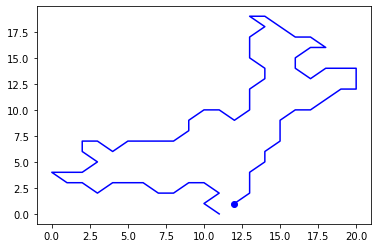

In [61]:
cell_idx = 113
cells = MainListOGD1
plt.plot(cells[cell_idx][:, 0], cells[cell_idx][:, 1], "blue")
plt.plot(cells[cell_idx][0, 0], cells[cell_idx][0, 1], "blue", marker="o");

In [64]:
ds = {}
#MainListOGD1 | MainListOGD3 | MainListControl
n_cells_arr = gs.zeros((6, 2))
TREATMENTS = ['Control' , 'OGD1', 'OGD3']
for i, treatment in enumerate(TREATMENTS):
    print(f"{treatment} :")
    ds[treatment] = {}
    for j, line in enumerate(LINES):
        print(treatment)
        print("red")
        print(line)
        nb = len(ds[treatment][line])
        print(f"\t {nb} {line}")
        n_cells_arr[i, j] = nb
        print("redred: ")
        print(i)
        print("blue: ")
        print(j)

n_cells_df = pd.DataFrame({"x": n_cells_arr[:, 0]})
n_cells_df = n_cells_df.set_index(TREATMENTS)

display(n_cells_df)
# display(ds)

Control :
Control
red
x


KeyError: 'x'

In [67]:
ds['nan']['x']

[array([[ 6.,  0.],
        [ 7.,  0.],
        [ 8.,  0.],
        [ 9.,  0.],
        [10.,  0.],
        [11.,  0.],
        [12.,  0.],
        [13.,  0.],
        [14.,  0.],
        [15.,  0.],
        [16.,  0.],
        [16.,  1.],
        [17.,  2.],
        [17.,  3.],
        [18.,  4.],
        [18.,  5.],
        [18.,  6.],
        [19.,  7.],
        [19.,  8.],
        [19.,  9.],
        [19., 10.],
        [20., 11.],
        [19., 12.],
        [18., 13.],
        [18., 14.],
        [18., 15.],
        [17., 16.],
        [18., 17.],
        [17., 17.],
        [16., 17.],
        [15., 17.],
        [14., 18.],
        [13., 18.],
        [13., 17.],
        [12., 16.],
        [12., 15.],
        [13., 16.],
        [14., 15.],
        [15., 14.],
        [14., 13.],
        [15., 13.],
        [16., 13.],
        [17., 12.],
        [16., 11.],
        [15., 11.],
        [16., 10.],
        [16.,  9.],
        [16.,  8.],
        [15.,  7.],
        [14.,  7.],


In [39]:
import pandas as pd

TREATMENTS = gs.unique(treatments)
print(TREATMENTS)
LINES = gs.unique(lines)
print(LINES)

['control' 'cytd' 'jasp']
['dlm8' 'dunn']


In [62]:
ds = {}

n_cells_arr = gs.zeros((3, 2))

for i, treatment in enumerate(TREATMENTS):
    print(f"{treatment} :")
    ds[treatment] = {}
    for j, line in enumerate(LINES):
        to_keep = gs.array(
            [
                one_treatment == treatment and one_line == line
                for one_treatment, one_line in zip(treatments, lines)
            ]
        )
        ds[treatment][line] = [
            cell_i for cell_i, to_keep_i in zip(cells1, to_keep) if to_keep_i
        ]
        nb = len(ds[treatment][line])
        print(f"\t {nb} {line}")
        n_cells_arr[i, j] = nb

n_cells_df = pd.DataFrame({"dlm8": n_cells_arr[:, 0], "dunn": n_cells_arr[:, 1]})
n_cells_df = n_cells_df.set_index(TREATMENTS)

display(n_cells_df)
# display(ds)

control :
	 114 dlm8
	 204 dunn
cytd :
	 82 dlm8
	 93 dunn
jasp :
	 62 dlm8
	 95 dunn


,dlm8,dunn
control,114.0,204.0
cytd,82.0,93.0
jasp,62.0,95.0


In [33]:
len(ds["nan"]["x"])

1

In [20]:
def apply_func_to_ds(input_ds, func):
    """Apply the input function func to the input dictionnary input_ds.

    This function goes through the dictionnary structure and applies
    func to every cell in input_ds[treatment][line].

    It stores the result in a dictionnary output_ds that is returned
    to the user.

    Parameters
    ----------
    input_ds : dict
        Input dictionnary, with keys treatment-line.
    func : callable
        Function to be applied to the values of the dictionnary, i.e.
        the cells.

    Returns
    -------
    output_ds : dict
        Output dictionnary, with the same keys as input_ds.
    """
    output_ds = {}
    for treatment in TREATMENTS:
        output_ds[treatment] = {}
        for line in LINES:
            output_list = []
            for one_cell in input_ds[treatment][line]:
                output_list.append(func(one_cell))
            output_ds[treatment][line] = gs.array(output_list)
    return output_ds

In [21]:
def interpolate(curve, nb_points):
    """Interpolate a discrete curve with nb_points from a discrete curve.

    Returns
    -------
    interpolation : discrete curve with nb_points points
    """
    old_length = curve.shape[0]
    interpolation = gs.zeros((nb_points, 2))
    incr = old_length / nb_points
    pos = 0
    for i in range(nb_points):
        index = int(gs.floor(pos))
        interpolation[i] = curve[index] + (pos - index) * (
            curve[(index + 1) % old_length] - curve[index]
        )
        pos += incr
    return interpolation


k_sampling_points = 20000

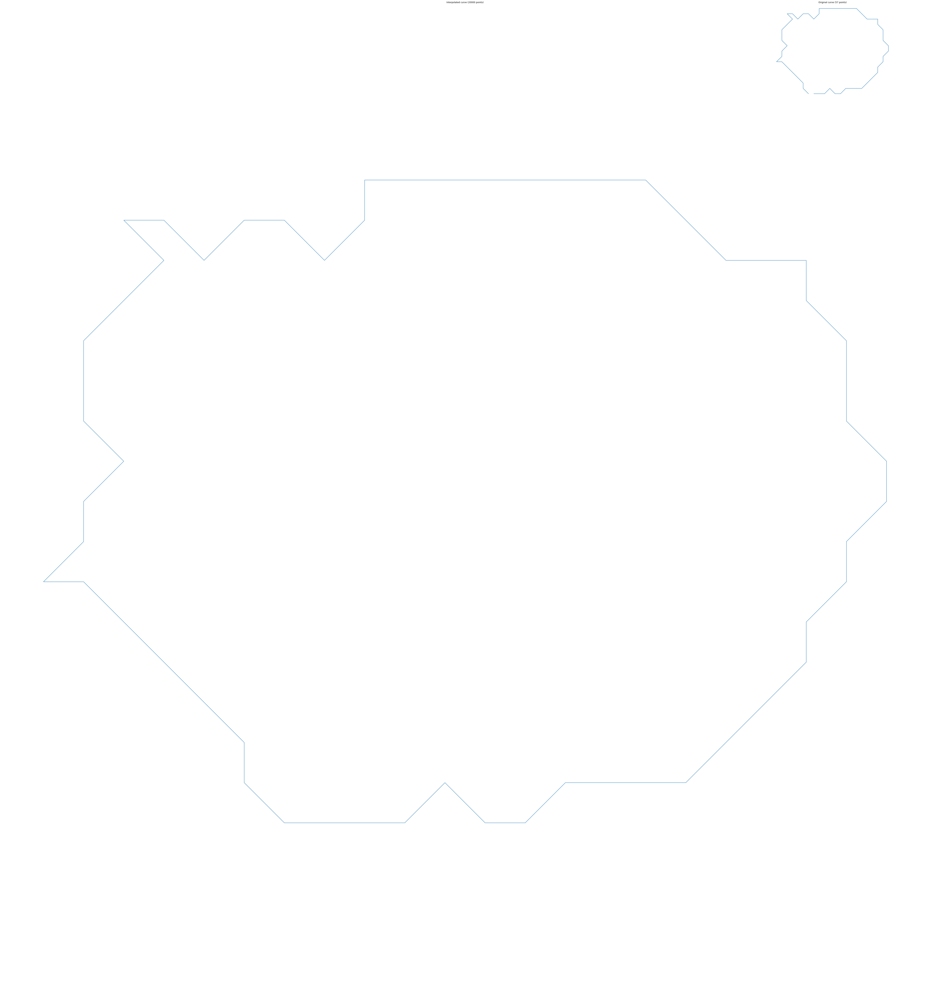

In [24]:
#cell_rand = cells[gs.random.randint(len(cells))]
cell_rand = cells[1]
cell_interpolation = interpolate(cell_rand, k_sampling_points)

fig = plt.figure(figsize=(200, 100))

fig.add_subplot(999)
plt.plot(cell_rand[:, 0], cell_rand[:, 1])
plt.axis("equal")
plt.title(f"Original curve ({len(cell_rand)} points)")
plt.axis("off")

fig.add_subplot(122)
plt.plot(cell_interpolation[:, 0], cell_interpolation[:, 1])
plt.axis("equal")
plt.title(f"Interpolated curve ({k_sampling_points} points)")
plt.axis("off")

plt.savefig("interpolation.svg")

In [25]:
ds_interp = apply_func_to_ds(
    input_ds=ds, func=lambda x: interpolate(x, k_sampling_points)
)

In [35]:
print(ds_interp["non-treated control"]["x"].shape)

(0,)


nan
x
[[[6.         0.        ]
  [6.00579977 0.        ]
  [6.01160002 0.        ]
  ...
  [5.98260021 0.        ]
  [5.98839998 0.        ]
  [5.99419975 0.        ]]]
[[[6.         0.        ]
  [6.00579977 0.        ]
  [6.01160002 0.        ]
  ...
  [5.98260021 0.        ]
  [5.98839998 0.        ]
  [5.99419975 0.        ]]]
[[[6.         0.        ]
  [6.00579977 0.        ]
  [6.01160002 0.        ]
  ...
  [5.98260021 0.        ]
  [5.98839998 0.        ]
  [5.99419975 0.        ]]]
[[[6.         0.        ]
  [6.00579977 0.        ]
  [6.01160002 0.        ]
  ...
  [5.98260021 0.        ]
  [5.98839998 0.        ]
  [5.99419975 0.        ]]]
[[[6.         0.        ]
  [6.00579977 0.        ]
  [6.01160002 0.        ]
  ...
  [5.98260021 0.        ]
  [5.98839998 0.        ]
  [5.99419975 0.        ]]]
[[[6.         0.        ]
  [6.00579977 0.        ]
  [6.01160002 0.        ]
  ...
  [5.98260021 0.        ]
  [5.98839998 0.        ]
  [5.99419975 0.        ]]]
[[[6.     

ValueError: a cannot be empty unless no samples aretaken

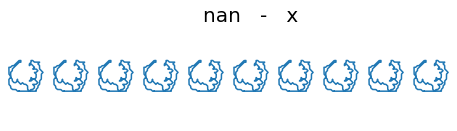

In [32]:
n_cells_to_plot = 10

fig = plt.figure(figsize=(16, 6))
count = 1
for treatment in TREATMENTS:
    for line in LINES:
        print(treatment)
        print(line)
        cell_data = ds_interp[treatment][line]
        for i_to_plot in range(n_cells_to_plot):
            print(cell_data)
            cell = gs.random.choice(cell_data)
            fig.add_subplot(3, 2 * n_cells_to_plot, count)
            count += 1
            plt.plot(cell[:, 0], cell[:, 1], color="C" + str(int((line == "dunn"))))
            plt.axis("equal")
            plt.axis("off")
            if i_to_plot == n_cells_to_plot // 2:
                plt.title(f"{treatment}   -   {line}", fontsize=20)
plt.savefig("cancer_cell_sample.svg")

In [16]:
import numpy as np

def preprocess(curve, tol=1e-10):
    """Preprocess curve to ensure that there are no consecutive duplicate points.

    Returns
    -------
    curve : discrete curve
    """

    dist = curve[1:] - curve[:-1]
    dist_norm = np.sqrt(np.sum(np.square(dist), axis=1))

    if np.any( dist_norm < tol ):
        for i in range(len(curve)-1):
            if np.sqrt(np.sum(np.square(curve[i+1] - curve[i]), axis=0)) < tol:
                curve[i+1] = (curve[i] + curve[i+2]) / 2

    return curve

In [17]:
from geomstats.geometry.pre_shape import PreShapeSpace

M_AMBIENT = 2

PRESHAPE_SPACE = PreShapeSpace(m_ambient=M_AMBIENT, k_landmarks=k_sampling_points)
PRESHAPE_METRIC = PRESHAPE_SPACE.embedding_metric


def exhaustive_align(curve, base_curve):
    """Align curve to base_curve to minimize the L² distance.

    Returns
    -------
    aligned_curve : discrete curve
    """
    nb_sampling = len(curve)
    distances = gs.zeros(nb_sampling)
    base_curve = gs.array(base_curve)
    for shift in range(nb_sampling):
        reparametrized = [curve[(i + shift) % nb_sampling] for i in range(nb_sampling)]
        aligned = PRESHAPE_SPACE.align(point=gs.array(reparametrized), base_point=base_curve)
        distances[shift] = PRESHAPE_METRIC.norm(
            gs.array(aligned) - gs.array(base_curve)
        )
    shift_min = gs.argmin(distances)
    reparametrized_min = [
        curve[(i + shift_min) % nb_sampling] for i in range(nb_sampling)
    ]
    aligned_curve = PRESHAPE_SPACE.align(
        point=gs.array(reparametrized_min), base_point=base_curve
    )
    return aligned_curve

In [18]:
ds_proc = apply_func_to_ds(ds_interp, func=lambda x: preprocess(x))

ds_proj = apply_func_to_ds(ds_proc, func=PRESHAPE_SPACE.projection)
print(ds_proj["control"]["dunn"].shape)

BASE_CURVE = ds_proj["control"]["dunn"][0]
print("Shape of BASE_CURVE:", BASE_CURVE.shape)

ds_align = apply_func_to_ds(ds_proj, func=lambda x: exhaustive_align(x, BASE_CURVE))
print(ds_align["control"]["dunn"].shape)

(204, 200, 2)
Shape of BASE_CURVE: (200, 2)
(204, 200, 2)


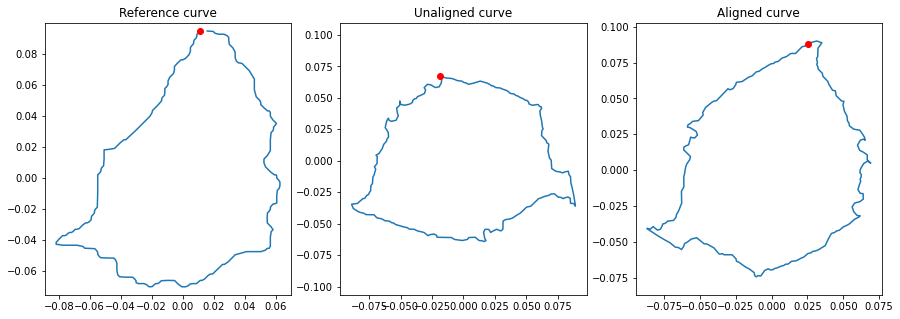

In [19]:
i_rand = gs.random.randint(n_cells_df.loc["control"]["dunn"])
unaligned_cell = ds_proj["control"]["dunn"][i_rand]
aligned_cell = ds_align["control"]["dunn"][i_rand]

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(131)
plt.plot(BASE_CURVE[:, 0], BASE_CURVE[:, 1])
plt.plot(BASE_CURVE[0, 0], BASE_CURVE[0, 1], "ro")
plt.axis("equal")
plt.title("Reference curve")

fig.add_subplot(132)
plt.plot(unaligned_cell[:, 0], unaligned_cell[:, 1])
plt.plot(unaligned_cell[0, 0], unaligned_cell[0, 1], "ro")
plt.axis("equal")
plt.title("Unaligned curve")

fig.add_subplot(133)
plt.plot(aligned_cell[:, 0], aligned_cell[:, 1])
plt.plot(aligned_cell[0, 0], aligned_cell[0, 1], "ro")
plt.axis("equal")
plt.title("Aligned curve")

plt.savefig("alignment.svg")